# Socioeconomic factors

In their reporting into youth violence,  "A Public Health Approach to Serious Youth Violence: Supporting Evidence" https://data.london.gov.uk/dataset/a-public-health-approach-to-serious-youth-violence, Greater London Authority (GLA) found that the following risk factors were most highly correlated with Serious Youth Violence:
- The rate of first-time entrants into the criminal justice system (aged 10-17)
- The proportion of children living in out-of-work benefit claimant households
- The Index of Multiple Deprivation (IMD) overall average score
- Long-term unemployment as measured by the rate of JSA claims of 1 year or more
- The estimated prevalence of emotional disorders amongst 5-16 year olds
- The estimated prevalence of mental health disorders amongst 5-16 year olds
- The rate of Looked After Children (LAC)
- The estimated prevalence of conduct disorders amongst 5-16 year olds
- The estimated prevalence of hyperkinetic disorders amongst 5-16 year olds
- The rate of conception in mothers under the age of 18
- Educational attainment (GCSE)
- The proportion of residents that feel gangs are a problem in their local area
- The rate of Domestic Violence and Abuse

In 2018 their Centre for Crime and Justice studies report "Young people, violence and knives - revisiting the evidence and policy discussions" - https://www.crimeandjustice.org.uk/publications/young-people-violence-and-knives-revisiting-evidence-and-policy-discussions , Roger Grimshaw and Matt Ford highlight the role of youth mental health and both inequality and absolute deprivation as being correlated with the levels of crime in an area. They also make explicit reference to the levels of children excluded from school and children in care.

In his paper into Inequality And Crime, The Review of Economics and Statistics, Morgan concludes that Inequality has a 'strong and robust impact on violent crime' and while police action is a deterrent to property crime, it had little impact on violent crime. Factors considered by Morgan included gini coefficient (inequality), female head of the family, ethnicity, unemployment, poverty and education.  

IN reviewing the efficacy of predicting policing technology. Wheeler et al (Wheeler, Andrew P. (04/24/2020). "Mapping the Risk Terrain for Crime Using Machine Learning". Journal of quantitative criminology (0748-4518))  considered the following demographic factors: poverty, female headed household, unemployment, moved in prior year, ethnic heterogeneity and proportions of black and hispanic populations, population density.

In viewing this research and the GLA analysis we can see that the characteristics we will need to consider will include deprivation and inequality, unemployment, single parent families, education levels, ethnicity, child mental health, rates of looked after children, exclusions from school and population density. Using these broad categories we will cover all categories considered within the GLA analysis apart from:
- We do not look at rates of entrance to the criminal justice system because we see this as a dependent variable rather than a charachteristic' 
- We do not look into gang membership because, as discussed by Grimshaw and Ford, that while the growth in gang and drug culture are associated with carrying knives, these must be viewed in the context of the wider socioeconomic conditions in an area as they are highly interrelated
- We cannot easily access data relating to conception in mothers under the age of 18 because this data relates to parents of youths perpetrating violent crime and so will span many years. We believe deriving this data would require a level of effort beyond the scope of this project.  

## Data sources

### Deprivation and inequality, unemployment
The UK government produce official statistics relating to deprivation and these can be found at https://www.gov.uk/government/statistics/english-indices-of-deprivation-2019. These indices provide data at LSOA level and are produced as a range of measures including decile, rank and score. We will use score as our measure for deprivation and inequality, unemployment. This is because, as the data providers explain, 'in the case of the Income Deprivation Domain, the Employment Deprivation Domain and the supplementary indices of income deprivation among children and older people, the scores are meaningful and relate to a proportion of the relevant population experiencing that type of deprivation. So, for example, if a Lower-layer Super Output Area has a score of 0.38 in the Income Deprivation Domain, this means that 38 per cent of the population is income deprived in that area'. 

### Single parent families, education levels, ethnicity and population density
Indices of deprivation cannot be used for Education because, as the data provider explains, scores aren't applicable because 'less easy to interpret as they do not relate straightforwardly to the proportion of the population experiencing deprivation. It is recommended that ranks and deciles, but not scores, are used in the case'. Unfortunately, ranking data does not tell us the extent of difference in conditions between the 10th ranked LSOA and the 12th, purely that one is more deprived than the other and so these cannot be reasonably treated as numeric features. For this reason we chose the London Datastore as our source for education data, because it is provided in numeric form. The specific source for this data can be found within 'data atlases' located at https://data.london.gov.uk/dataset/lsoa-atlas and we also use this data as the source for single parent families, ethnicity, population density (and other barriers to housing) data. 

However, it is important to explain that these atlases are based on 2011 census data and so one needs to be cognisant that the data would have been 8 years out of date by 2019, the period for which we collated crime data. This is a concern because it means education and housing data will not include any impacts of policy changes post 2010. For health data we will specifically use child mental health statistics because that is explicity referenced in the GLA analysis.

### Child mental health, rates of looked after children and school exclusions 
This data is only available at borough level rather than LSOA level and will be sourced as follows:
- rates of looked after children: https://www.gov.uk/government/statistics/children-looked-after-in-england-including-adoption-2018-to-2019
- exclusions from school: https://explore-education-statistics.service.gov.uk/find-statistics/permanent-and-fixed-period-exclusions-in-england#dataDownloads-1
- child mental health: Mental health: https://fingertips.phe.org.uk/profile-group/mental-health/profile/cypmh/data#page/0/gid/1938133090/pat/6/par/E12000007/ati/102/are/E09000002/iid/93587/age/221/sex/4/cid/4/tbm/1

### Data consistency
Crime data and indices of deprivation data for income and education are at LSOA level and for the year 2019. The London Atlas data is also at LSOA level, but is based on the 2011 census, which leads to concerns discussed previously. The remaining data is only at borough level, and within that child mental health data is from 2018/2019, looked after children data is from 2019 and exclusions from school is from 2018-19.

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import altair as alt
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
import numpy as np

### Load income and employment data from Indices of deprivation

In [2]:
column_names = ['lsoa_code', 'lsoa_name', 'lad_code', 'lad_name', 'income_deprivation_score', 'employment_deprivation_score', 'child_income_deprivation_score']

income_employment_england = pd.read_excel(".\DataSources\Income and Deprivation\File_5_-_IoD2019_Scores.xlsx", 
                                 sheet_name='IoD2019 Scores', usecols = "A:D, F, G, M", names=column_names)

print(income_employment_england.shape)
income_employment_england.head()

(32844, 7)


,lsoa_code,lsoa_name,lad_code,lad_name,income_deprivation_score,employment_deprivation_score,child_income_deprivation_score
0,E01000001,City of London 001A,E09000001,City of London,0.007,0.010,0.006
1,E01000002,City of London 001B,E09000001,City of London,0.034,0.027,0.037
2,E01000003,City of London 001C,E09000001,City of London,0.086,0.086,0.052
3,E01000005,City of London 001E,E09000001,City of London,0.211,0.136,0.209
4,E01000006,Barking and Dagenham 016A,E09000002,Barking and Dagenham,0.117,0.059,0.155


In [3]:
income_employment_england = income_employment_england.dropna(how='all') # only drops a row when every column is NA
print(income_employment_england.shape)

# Now check for NaN values
nan_values = income_employment_england[income_employment_england.isna().any(axis=1)]
nan_values

(32844, 7)


,lsoa_code,lsoa_name,lad_code,lad_name,income_deprivation_score,employment_deprivation_score,child_income_deprivation_score


### London data atlas
#### Source data manipulation
I had problems loading the original source data and to resolve it I created new tabs, copied the data and removed the headers rows. The new tabs created were as follows:
- data_1 - iadatasheet1
- data_2 - iadatasheet2

In [4]:
column_names = ['lsoa_code', 'lsoa_name', 'population_density', 'lone_parent_pct', 'ethnic_white_pct', 
                'ethnic_mixed_pct', 'ethnic_asian_pct', 'ethnic_black_pct', 
                'ethnic_other_pct', 'homeowner_outright_pct', 'homeowner_mortgage_pct', 'rent_social_pct',
                'rent_private_pct', 'median_house_price']

london_atlas_sheet1 = pd.read_excel(".\DataSources\Income and Deprivation\london_data_atlas_lsoa.xls", 
                                 sheet_name='data_1', header=None,
                                 usecols = "A, B, CY, DH, DQ:DU, FA, FB, FC, FD, FW", 
                                 names=column_names)


print(london_atlas_sheet1.shape)
london_atlas_sheet1.head()

(4835, 14)


,lsoa_code,lsoa_name,population_density,lone_parent_pct,ethnic_white_pct,ethnic_mixed_pct,ethnic_asian_pct,ethnic_black_pct,ethnic_other_pct,homeowner_outright_pct,homeowner_mortgage_pct,rent_social_pct,rent_private_pct,median_house_price
0,E01000907,Camden 001A,136.753731,21.052632,73.496503,7.272727,8.531469,7.902098,2.797203,12.6,18.0,54.4,13.7,568500
1,E01000908,Camden 001B,94.114286,13.180169,72.422517,8.665402,6.198608,8.032891,4.680582,14.0,17.7,52.6,14.0,350000
2,E01000909,Camden 001C,71.828521,7.261725,84.076828,5.514250,4.646840,2.850062,2.912020,38.3,21.2,18.6,18.8,1412500
3,E01000912,Camden 001D,18.446602,15.714286,77.344242,5.601007,5.097546,9.188169,2.769037,15.3,14.6,51.3,15.0,725000
4,E01000913,Camden 001E,11.298701,3.739612,88.187135,5.087719,4.736842,1.286550,0.701754,47.1,27.6,1.9,19.4,996585


In [5]:
column_names_ = ['lsoa_code', 'no_qualifications_pct', 'degree_educated_pct']

london_atlas_sheet2 = pd.read_excel(".\DataSources\Income and Deprivation\london_data_atlas_lsoa.xls", 
                                 sheet_name='data_2', header=None,
                                 usecols = "A, X, AC", 
                                 names=column_names_)


print(london_atlas_sheet2.shape)
london_atlas_sheet2.head()

(4835, 3)


,lsoa_code,no_qualifications_pct,degree_educated_pct
0,E01000907,20.0,44.2
1,E01000908,15.0,50.4
2,E01000909,9.6,61.9
3,E01000912,18.0,47.2
4,E01000913,4.9,65.2


In [6]:
london_atlas_raw = pd.merge(london_atlas_sheet1, london_atlas_sheet2, left_on='lsoa_code', 
                            right_on='lsoa_code', how = 'inner')

print(london_atlas_raw.shape)
london_atlas_raw.head()

(4835, 16)


,lsoa_code,lsoa_name,population_density,lone_parent_pct,ethnic_white_pct,ethnic_mixed_pct,ethnic_asian_pct,ethnic_black_pct,ethnic_other_pct,homeowner_outright_pct,homeowner_mortgage_pct,rent_social_pct,rent_private_pct,median_house_price,no_qualifications_pct,degree_educated_pct
0,E01000907,Camden 001A,136.753731,21.052632,73.496503,7.272727,8.531469,7.902098,2.797203,12.6,18.0,54.4,13.7,568500,20.0,44.2
1,E01000908,Camden 001B,94.114286,13.180169,72.422517,8.665402,6.198608,8.032891,4.680582,14.0,17.7,52.6,14.0,350000,15.0,50.4
2,E01000909,Camden 001C,71.828521,7.261725,84.076828,5.514250,4.646840,2.850062,2.912020,38.3,21.2,18.6,18.8,1412500,9.6,61.9
3,E01000912,Camden 001D,18.446602,15.714286,77.344242,5.601007,5.097546,9.188169,2.769037,15.3,14.6,51.3,15.0,725000,18.0,47.2
4,E01000913,Camden 001E,11.298701,3.739612,88.187135,5.087719,4.736842,1.286550,0.701754,47.1,27.6,1.9,19.4,996585,4.9,65.2


In [7]:
london_atlas_raw = london_atlas_raw.dropna(how='all') # only drops a row when every column is NA
print(london_atlas_raw.shape)

# Now check for NaN values
nan_values = london_atlas_raw[london_atlas_raw.isna().any(axis=1)]
nan_values

(4835, 16)


,lsoa_code,lsoa_name,population_density,lone_parent_pct,ethnic_white_pct,ethnic_mixed_pct,ethnic_asian_pct,ethnic_black_pct,ethnic_other_pct,homeowner_outright_pct,homeowner_mortgage_pct,rent_social_pct,rent_private_pct,median_house_price,no_qualifications_pct,degree_educated_pct


In [8]:
column_names = london_atlas_raw.columns.to_list()
column_names

['lsoa_code',
 'lsoa_name',
 'population_density',
 'lone_parent_pct',
 'ethnic_white_pct',
 'ethnic_mixed_pct',
 'ethnic_asian_pct',
 'ethnic_black_pct',
 'ethnic_other_pct',
 'homeowner_outright_pct',
 'homeowner_mortgage_pct',
 'rent_social_pct',
 'rent_private_pct',
 'median_house_price',
 'no_qualifications_pct',
 'degree_educated_pct']

In [9]:
pct_fields = [ 'lone_parent_pct',
 'ethnic_white_pct',
 'ethnic_mixed_pct',
 'ethnic_asian_pct',
 'ethnic_black_pct',
 'ethnic_other_pct',
 'homeowner_outright_pct',
 'homeowner_mortgage_pct',
 'rent_social_pct',
 'rent_private_pct',
 'no_qualifications_pct',
 'degree_educated_pct']

other_numeric_fields = ['population_density', 'median_house_price']

all_numeric_fields = pct_fields + other_numeric_fields

numeric_fields_df = london_atlas_raw[all_numeric_fields].apply(pd.to_numeric,errors='coerce')

# Now check for NaN values

nan_values_ = numeric_fields_df[numeric_fields_df.isna().any(axis=1)]
print(nan_values_.shape)
print("\nfields with nan_values\n")
nan_values_

(2, 14)

fields with nan_values



,lone_parent_pct,ethnic_white_pct,ethnic_mixed_pct,ethnic_asian_pct,ethnic_black_pct,ethnic_other_pct,homeowner_outright_pct,homeowner_mortgage_pct,rent_social_pct,rent_private_pct,no_qualifications_pct,degree_educated_pct,population_density,median_house_price
1347,21.142857,25.468425,8.258154,11.797363,50.242887,4.233171,4.4,5.5,80.8,8.2,25.4,23.9,274.108818,NaN
2872,27.366609,63.912201,7.101356,2.840542,24.531956,1.613944,10.7,16.9,67.3,4.6,37.0,11.6,60.281470,NaN


### Comments
The following numeric fields need dealing with:
- 1347 - Southwark 015C - just set to median_house_price from prior year - 156000
- 2872 - Croydon 030A - just set to median_house_price from prior year - 161000

Then after that, convert percent fields thyrough dividing by 100, standard scale the population density, house price and income fields and then create a tidy dataframe prior to reviewing data distributions.

In [10]:
london_atlas = london_atlas_raw[['lsoa_code', 'lsoa_name']]
london_atlas = london_atlas.join(numeric_fields_df)
print(london_atlas.shape)

london_atlas.loc[london_atlas.lsoa_name == 'Southwark 015C', 'median_house_price'] = 156000
london_atlas.loc[london_atlas.lsoa_name == 'Croydon 030A', 'median_house_price'] = 161000
                  
print(london_atlas.shape)
london_atlas[london_atlas.lsoa_name.isin(['Croydon 030A', 'Southwark 015C']) ]

(4835, 16)
(4835, 16)


,lsoa_code,lsoa_name,lone_parent_pct,ethnic_white_pct,ethnic_mixed_pct,ethnic_asian_pct,ethnic_black_pct,ethnic_other_pct,homeowner_outright_pct,homeowner_mortgage_pct,rent_social_pct,rent_private_pct,no_qualifications_pct,degree_educated_pct,population_density,median_house_price
1347,E01003968,Southwark 015C,21.142857,25.468425,8.258154,11.797363,50.242887,4.233171,4.4,5.5,80.8,8.2,25.4,23.9,274.108818,156000.0
2872,E01001051,Croydon 030A,27.366609,63.912201,7.101356,2.840542,24.531956,1.613944,10.7,16.9,67.3,4.6,37.0,11.6,60.281470,161000.0


In [11]:
from sklearn.preprocessing import MinMaxScaler

london_atlas_wide = london_atlas[['lsoa_code', 'lsoa_name']]
df_pct_fields = london_atlas[pct_fields].div(100)
df_numeric = london_atlas[other_numeric_fields]

minmax = MinMaxScaler()
minmax = minmax.fit(df_numeric)
numeric_ss = minmax.transform(df_numeric)

df_numeric_ss = pd.DataFrame(numeric_ss, columns=other_numeric_fields)

london_atlas_wide = london_atlas_wide.join(df_pct_fields)
london_atlas_wide = london_atlas_wide.join(df_numeric_ss)
print(london_atlas_wide.shape)
london_atlas_wide.head()

(4835, 16)


,lsoa_code,lsoa_name,lone_parent_pct,ethnic_white_pct,ethnic_mixed_pct,ethnic_asian_pct,ethnic_black_pct,ethnic_other_pct,homeowner_outright_pct,homeowner_mortgage_pct,rent_social_pct,rent_private_pct,no_qualifications_pct,degree_educated_pct,population_density,median_house_price
0,E01000907,Camden 001A,0.210526,0.734965,0.072727,0.085315,0.079021,0.027972,0.126,0.180,0.544,0.137,0.200,0.442,0.168999,0.099591
1,E01000908,Camden 001B,0.131802,0.724225,0.086654,0.061986,0.080329,0.046806,0.140,0.177,0.526,0.140,0.150,0.504,0.115812,0.052541
2,E01000909,Camden 001C,0.072617,0.840768,0.055143,0.046468,0.028501,0.029120,0.383,0.212,0.186,0.188,0.096,0.619,0.088014,0.281331
3,E01000912,Camden 001D,0.157143,0.773442,0.056010,0.050975,0.091882,0.027690,0.153,0.146,0.513,0.150,0.180,0.472,0.021427,0.133290
4,E01000913,Camden 001E,0.037396,0.881871,0.050877,0.047368,0.012865,0.007018,0.471,0.276,0.019,0.194,0.049,0.652,0.012511,0.191771


### Now merge with indices data

In [12]:
london_features = pd.merge(income_employment_england, london_atlas_wide, left_on='lsoa_code', 
                            right_on='lsoa_code', how = 'inner')

london_features.rename(columns = {'lsoa_name_x':'lsoa_name'}, inplace = True)
london_features.drop('lsoa_name_y', axis=1, inplace=True)

print(london_features.shape)
london_features.head()

(4835, 21)


,lsoa_code,lsoa_name,lad_code,lad_name,income_deprivation_score,employment_deprivation_score,child_income_deprivation_score,lone_parent_pct,ethnic_white_pct,ethnic_mixed_pct,...,ethnic_black_pct,ethnic_other_pct,homeowner_outright_pct,homeowner_mortgage_pct,rent_social_pct,rent_private_pct,no_qualifications_pct,degree_educated_pct,population_density,median_house_price
0,E01000001,City of London 001A,E09000001,City of London,0.007,0.010,0.006,0.026256,0.845051,0.036860,...,0.007509,0.023208,0.405,0.203,0.047,0.301,0.019,0.776,0.140067,0.132214
1,E01000002,City of London 001B,E09000001,City of London,0.034,0.027,0.037,0.026506,0.887187,0.037604,...,0.002786,0.006267,0.378,0.257,0.058,0.264,0.023,0.792,0.077879,0.157300
2,E01000003,City of London 001C,E09000001,City of London,0.086,0.086,0.052,0.059976,0.783804,0.040862,...,0.033432,0.017088,0.225,0.175,0.361,0.217,0.130,0.568,0.284826,0.082149
3,E01000005,City of London 001E,E09000001,City of London,0.211,0.136,0.209,0.094218,0.513706,0.059898,...,0.101523,0.046701,0.051,0.047,0.668,0.216,0.244,0.345,0.075522,0.066430
4,E01000006,Barking and Dagenham 016A,E09000002,Barking and Dagenham,0.117,0.059,0.155,0.099448,0.327070,0.034058,...,0.103934,0.029360,0.250,0.385,0.033,0.328,0.182,0.329,0.144255,0.034776


In [13]:
super_numeric_fields = ['income_deprivation_score', 'employment_deprivation_score', 'child_income_deprivation_score'] + all_numeric_fields

london_features_tidy = pd.melt(london_features, id_vars=['lsoa_code', 'lsoa_name', 'lad_code', 'lad_name'], 
                        value_vars=super_numeric_fields, var_name = 'feature', value_name='value')

london_features_tidy.head()

,lsoa_code,lsoa_name,lad_code,lad_name,feature,value
0,E01000001,City of London 001A,E09000001,City of London,income_deprivation_score,0.007
1,E01000002,City of London 001B,E09000001,City of London,income_deprivation_score,0.034
2,E01000003,City of London 001C,E09000001,City of London,income_deprivation_score,0.086
3,E01000005,City of London 001E,E09000001,City of London,income_deprivation_score,0.211
4,E01000006,Barking and Dagenham 016A,E09000002,Barking and Dagenham,income_deprivation_score,0.117


## Distributional analysis
We will perform the following broad steps
1. Assess distribution
    - Use histograms to review the distribution for each feature to check for normality, skewness and evidence of bi or multi modality within the data
    - if we identify skewness, then plot historograms for log distributions to see whether that addresses the skewness
    - if we identify multi modes within the data then review further as part of our outlier analysis 
2. Analyse outliers
    - use boxplots to get an overview of distributions and outliers and also create reports of all values falling outside mean +/- 2.5 standard deviations to assess the extent of the outliers. 
    - fix outliers which have arisen erroneously, but look at different strategies (e.g. using 'robust' statistics) if the outliers actually reveal important informaton about our locations and distributions
3. Define strategy for outliers and distribution
    - We will discuss our approach to subsequent inferential statistics based on our findings
    
    
It is important to note that dealing with outliers will affect distributions and transforming distributions will have an effect on outliers and so the two approaches work hand in hand. It is also important to note that creating log distributions can resolve issues with low values but do skew the results for high values. This means we will only use a log transformation when it materially improves the skewness and so the default position is to use the original data values.
    
### Use Histograms to review the distributions
n.b. We create two batches of histograms to ease scrolling

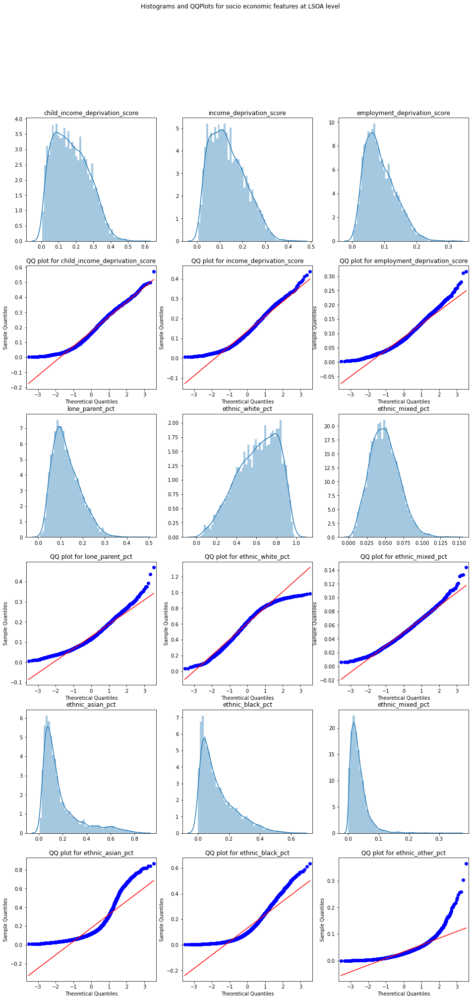

In [14]:
f, axes = plt.subplots(6, 3, figsize=(16,32))
f.suptitle('Histograms and QQPlots for socio economic features at LSOA level')
sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='child_income_deprivation_score']), bins=50, ax=axes[0,0])
axes[0,0].set_title('child_income_deprivation_score')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='child_income_deprivation_score']), line='r', ax=axes[1,0])
axes[1,0].set_title('QQ plot for child_income_deprivation_score')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='income_deprivation_score']), bins=50, ax=axes[0,1])
axes[0,1].set_title('income_deprivation_score')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='income_deprivation_score']), line='r', ax=axes[1,1])
axes[1,1].set_title('QQ plot for income_deprivation_score')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='employment_deprivation_score']), bins=50, ax=axes[0,2])
axes[0,2].set_title('employment_deprivation_score')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='employment_deprivation_score']), line='r', ax=axes[1,2])
axes[1,2].set_title('QQ plot for employment_deprivation_score')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='lone_parent_pct']), bins=50, ax=axes[2,0])
axes[2,0].set_title('lone_parent_pct')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='lone_parent_pct']), line='r', ax=axes[3,0])
axes[3,0].set_title('QQ plot for lone_parent_pct')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_white_pct']), bins=50, ax=axes[2,1])
axes[2,1].set_title('ethnic_white_pct')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_white_pct']), line='r', ax=axes[3,1])
axes[3,1].set_title('QQ plot for ethnic_white_pct')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_mixed_pct']), bins=50, ax=axes[2,2])
axes[2,2].set_title('ethnic_mixed_pct')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_mixed_pct']), line='r', ax=axes[3,2])
axes[3,2].set_title('QQ plot for ethnic_mixed_pct')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_asian_pct']), bins=50, ax=axes[4,0])
axes[4,0].set_title('ethnic_asian_pct')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_asian_pct']), line='r', ax=axes[5,0])
axes[5,0].set_title('QQ plot for ethnic_asian_pct')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_black_pct']), bins=50, ax=axes[4,1])
axes[4,1].set_title('ethnic_black_pct')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_black_pct']), line='r', ax=axes[5,1])
axes[5,1].set_title('QQ plot for ethnic_black_pct')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_other_pct']), bins=50, ax=axes[4,2])
axes[4,2].set_title('ethnic_mixed_pct')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_other_pct']), line='r', ax=axes[5,2])
axes[5,2].set_title('QQ plot for ethnic_other_pct')

plt.show()

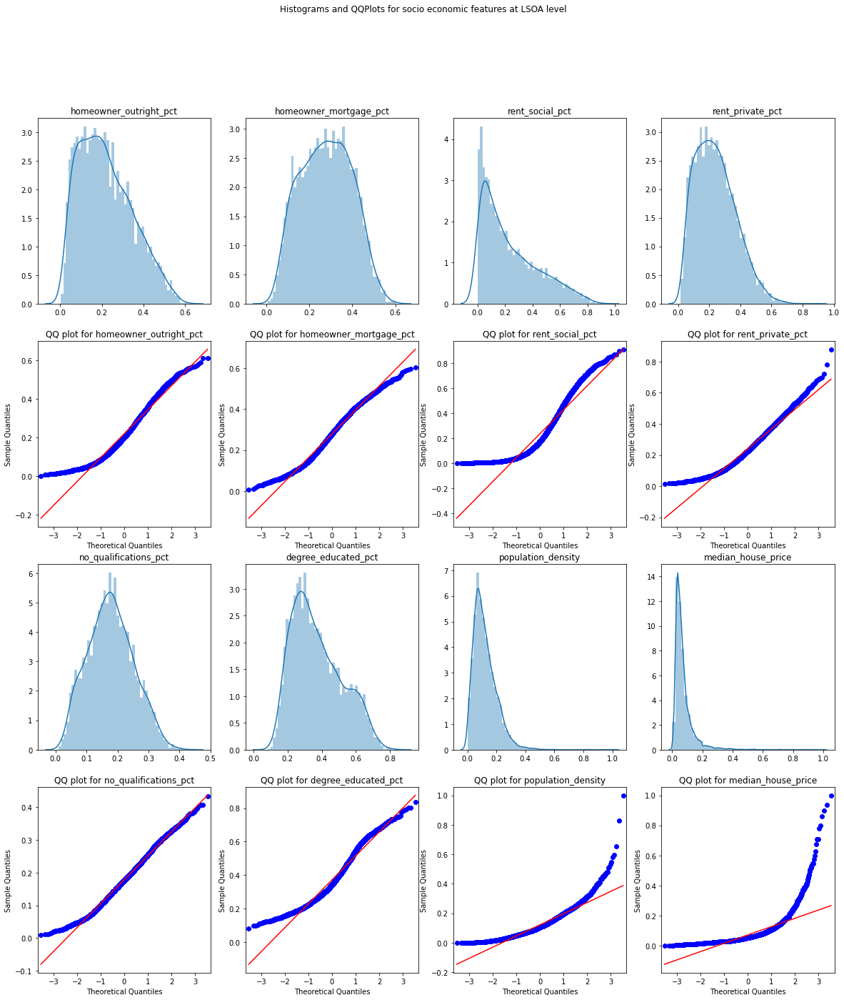

In [15]:
f, axes = plt.subplots(4, 4, figsize=(20,22))
f.suptitle('Histograms and QQPlots for socio economic features at LSOA level')
sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='homeowner_outright_pct']), bins=50, ax=axes[0,0])
axes[0,0].set_title('homeowner_outright_pct')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='homeowner_outright_pct']), line='r', ax=axes[1,0])
axes[1,0].set_title('QQ plot for homeowner_outright_pct')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='homeowner_mortgage_pct']), bins=50, ax=axes[0,1])
axes[0,1].set_title('homeowner_mortgage_pct')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='homeowner_mortgage_pct']), line='r', ax=axes[1,1])
axes[1,1].set_title('QQ plot for homeowner_mortgage_pct')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='rent_social_pct']), bins=50, ax=axes[0,2])
axes[0,2].set_title('rent_social_pct')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='rent_social_pct']), line='r', ax=axes[1,2])
axes[1,2].set_title('QQ plot for rent_social_pct')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='rent_private_pct']), bins=50, ax=axes[0,3])
axes[0,3].set_title('rent_private_pct')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='rent_private_pct']), line='r', ax=axes[1,3])
axes[1,3].set_title('QQ plot for rent_private_pct')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='no_qualifications_pct']), bins=50, ax=axes[2,0])
axes[2,0].set_title('no_qualifications_pct')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='no_qualifications_pct']), line='r', ax=axes[3,0])
axes[3,0].set_title('QQ plot for no_qualifications_pct')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='degree_educated_pct']), bins=50, ax=axes[2,1])
axes[2,1].set_title('degree_educated_pct')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='degree_educated_pct']), line='r', ax=axes[3,1])
axes[3,1].set_title('QQ plot for degree_educated_pct')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='population_density']), bins=50, ax=axes[2,2])
axes[2,2].set_title('population_density')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='population_density']), line='r', ax=axes[3,2])
axes[3,2].set_title('QQ plot for population_density')

sns.distplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='median_house_price']), bins=50, ax=axes[2,3])
axes[2,3].set_title('median_house_price')
sm.qqplot(np.array(london_features_tidy['value'][london_features_tidy.feature=='median_house_price']), line='r', ax=axes[3,3])
axes[3,3].set_title('QQ plot for median_house_price')

plt.show()

### Comments on distributions
We can see that there is some degree of skew in most of our distributions, but the distributions where it is most pronounced, and hence we will review their log distributions, are as follows:
- ethic_asian_pct
- ethnic_black_pct
- ethnic_other
- rent_social_pct
- population_density
- median_house_price

However, on the positive side there is no material multi modality and where it does exist (degree_educated_pct, ethnic_asian_pct), it is slight and so we do not propose any material transformation beyond that proposed for dealing with outliers. 

Now we will review log distributions but first we need to transform data for ethnic_other, rent_social band, population_density (Enfield - missing data?) and median_house_price (Bexley 008B) as they contain zero values, for which we cannot derive a log value. For these features we will set a zero value to the minimum value

In [16]:
print(london_features_tidy[(london_features_tidy.feature == 'population_density') &
                                            (london_features_tidy.value == 0)])

print(london_features_tidy[(london_features_tidy.feature == 'median_house_price') &
                                            (london_features_tidy.value == 0)])

       lsoa_code     lsoa_name   lad_code lad_name             feature  value
73916  E01001412  Enfield 004C  E09000010  Enfield  population_density    0.0
       lsoa_code    lsoa_name   lad_code lad_name             feature  value
77783  E01000429  Bexley 008B  E09000004   Bexley  median_house_price    0.0


In [17]:
min_val_rent = london_features_tidy['value'][(london_features_tidy.feature == 'rent_social_pct') &
                                            (london_features_tidy.value > 0)].min()
min_val_ethnic = london_features_tidy['value'][(london_features_tidy.feature == 'ethnic_other_pct') &
                                            (london_features_tidy.value > 0)].min()
min_pop = london_features_tidy['value'][(london_features_tidy.feature == 'population_density') &
                                            (london_features_tidy.value > 0)].min()
min_house = london_features_tidy['value'][(london_features_tidy.feature == 'median_house_price') &
                                            (london_features_tidy.value > 0)].min()

london_features_tidy.loc[(london_features_tidy.feature == 'rent_social_pct') &
                                            (london_features_tidy.value == 0), "value"] = min_val_rent
london_features_tidy.loc[(london_features_tidy.feature == 'ethnic_other_pct') &
                                            (london_features_tidy.value == 0), "value"] = min_val_ethnic
london_features_tidy.loc[(london_features_tidy.feature == 'population_density') &
                                            (london_features_tidy.value == 0), "value"] = min_pop
london_features_tidy.loc[(london_features_tidy.feature == 'median_house_price') &
                                            (london_features_tidy.value == 0), "value"] = min_house

min_val_rent, min_val_ethnic, min_pop, min_house

(0.002, 0.0006013229104028864, 4.490639972569519e-07, 0.0007536606373815674)

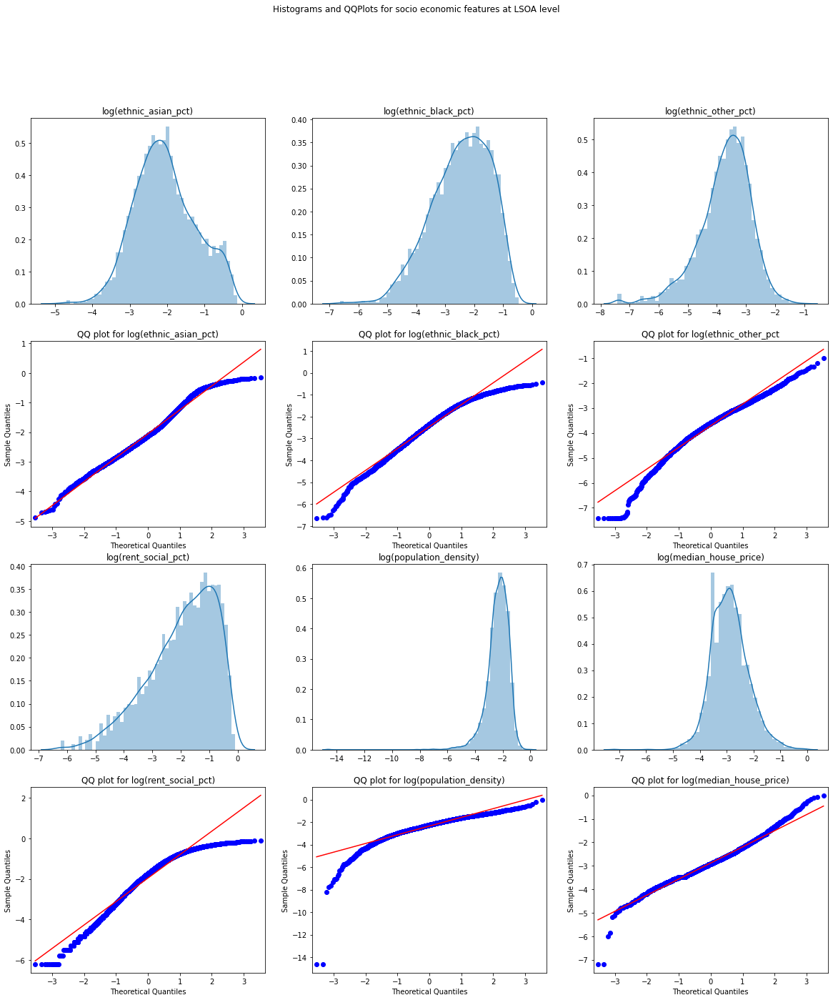

In [18]:
f, axes = plt.subplots(4, 3, figsize=(20,22))
f.suptitle('Histograms and QQPlots for socio economic features at LSOA level')
sns.distplot(np.array(np.log(london_features_tidy['value'][london_features_tidy.feature=='ethnic_asian_pct'])), bins=50, ax=axes[0,0])
axes[0,0].set_title('log(ethnic_asian_pct)')
sm.qqplot(np.log(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_asian_pct'])), line='r', ax=axes[1,0])
axes[1,0].set_title('QQ plot for log(ethnic_asian_pct)')

sns.distplot(np.array(np.log(london_features_tidy['value'][london_features_tidy.feature=='ethnic_black_pct'])), bins=50, ax=axes[0,1])
axes[0,1].set_title('log(ethnic_black_pct)')
sm.qqplot(np.array(np.log(london_features_tidy['value'][london_features_tidy.feature=='ethnic_black_pct'])), line='r', ax=axes[1,1])
axes[1,1].set_title('QQ plot for log(ethnic_black_pct)')

sns.distplot(np.log(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_other_pct'])), bins=50, ax=axes[0,2])
axes[0,2].set_title('log(ethnic_other_pct)')
sm.qqplot(np.log(np.array(london_features_tidy['value'][london_features_tidy.feature=='ethnic_other_pct'])), line='r', ax=axes[1,2])
axes[1,2].set_title('QQ plot for log(ethnic_other_pct')

sns.distplot(np.log(np.array(london_features_tidy['value'][london_features_tidy.feature=='rent_social_pct'])), bins=50, ax=axes[2,0])
axes[2,0].set_title('log(rent_social_pct)')
sm.qqplot(np.log(np.array(london_features_tidy['value'][london_features_tidy.feature=='rent_social_pct'])), line='r', ax=axes[3,0])
axes[3,0].set_title('QQ plot for log(rent_social_pct)')

sns.distplot(np.log(np.array(london_features_tidy['value'][london_features_tidy.feature=='population_density'])), bins=50, ax=axes[2,1])
axes[2,1].set_title('log(population_density)')
sm.qqplot(np.log(np.array(london_features_tidy['value'][london_features_tidy.feature=='population_density'])), line='r', ax=axes[3,1])
axes[3,1].set_title('QQ plot for log(population_density)')

sns.distplot(np.log(np.array(london_features_tidy['value'][london_features_tidy.feature=='median_house_price'])), bins=50, ax=axes[2,2])
axes[2,2].set_title('log(median_house_price)')
sm.qqplot(np.log(np.array(london_features_tidy['value'][london_features_tidy.feature=='median_house_price'])), line='r', ax=axes[3,2])
axes[3,2].set_title('QQ plot for log(median_house_price)')

plt.show()

### Comments
There is a material improvement in distribution for ethnic_asian_pct, asian_black_pct, asian_other_pct and median_house_price and it is worth using the log values in these cases. Howvere, it is more of a marginal decision for rent_social_pct and population_density but we will considere using log values for these features at the moment.

### Outlier analysis
We will first use box plots to get an overview of the outliers and then drill into specific features to understand their extent and also whether we need to prune them.

In [19]:
import plotly.express as px
fig = px.box(london_features_tidy, x="feature", y="value")
fig.show()

### Comments 
As expected, the features with the highest number of outliers are also those whose distribution exhibited the greatest amount of skew. We will now get specific statistics for these outliers by reporting the number which fall outside median + 2 standard deviations

In [20]:
def get_outliers(london_features_tidy):
    # Now produce distributions
    all_features = london_features_tidy['feature'].unique()
    london_features_tidy['Median'] = 0
    london_features_tidy['STD'] = 0
    london_features_tidy['Plus3SD'] = 0
    london_features_tidy['Minus3SD'] = 0
    london_features_tidy['Upper'] = 0
    london_features_tidy['Lower'] = 0
    london_features_tidy['outlier_upper'] = 0
    london_features_tidy['outlier_lower'] = 0
    

    for this_feature in all_features:
                        
        feature_median = london_features_tidy['value'][london_features_tidy.feature == this_feature].median()
        feature_std = london_features_tidy['value'][london_features_tidy.feature == this_feature].std()
        feature_upper = feature_median + 2.5 * feature_std;
        feature_lower = feature_median - 2.5 * feature_std;
       
        london_features_tidy.loc[london_features_tidy.feature == this_feature, "Mean"] = feature_median
        london_features_tidy.loc[london_features_tidy.feature == this_feature, "STD"] = feature_std
        london_features_tidy.loc[london_features_tidy.feature == this_feature, "Upper"] = feature_upper
        london_features_tidy.loc[london_features_tidy.feature == this_feature, "Lower"] = feature_lower
        
        london_features_tidy.loc[(london_features_tidy.feature == this_feature) & (london_features_tidy.value > feature_upper), "outlier_upper"] = 1
        london_features_tidy.loc[(london_features_tidy.feature == this_feature) & (london_features_tidy.value < feature_lower), "outlier_lower"] = 1

    london_features_tidy.drop(['Median','STD','Plus3SD', 'Minus3SD', 'Upper', 'Lower'], axis=1, inplace=True)
    
    outliers = london_features_tidy[(london_features_tidy.outlier_upper==1) | (london_features_tidy.outlier_lower==1)]
    
    return outliers

outliers = get_outliers(london_features_tidy)

In [21]:
print("Total number of feature rows = {0:} \n".format(london_features_tidy.feature.count()))

print("Total number of outliers = {0:} \n".format(outliers.outlier_lower.count()))

print("Outlier totals by feature type")

outliers_totals = outliers.groupby(['feature']).agg({'outlier_upper':'sum','outlier_lower':'sum'}).reset_index()
outliers_totals

Total number of feature rows = 82195 

Total number of outliers = 1768 

Outlier totals by feature type


,feature,outlier_upper,outlier_lower
0,child_income_deprivation_score,39,0
1,degree_educated_pct,54,0
2,employment_deprivation_score,99,0
3,ethnic_asian_pct,308,0
4,ethnic_black_pct,213,0
5,ethnic_mixed_pct,59,0
6,ethnic_other_pct,146,0
7,ethnic_white_pct,0,52
8,homeowner_mortgage_pct,7,0
9,homeowner_outright_pct,69,0


In [22]:
upper = alt.Chart(outliers[outliers.outlier_upper==1], title = 'outliers on upper side').mark_circle(size=60).encode(
    x=alt.X('value:Q', axis=alt.Axis(title='value', ticks=False)),
    y=alt.Y('feature:N', axis=alt.Axis(title=None, ticks=False)),  
    tooltip=['lsoa_name', 'value']
    ).interactive()

lower = alt.Chart(outliers[outliers.outlier_lower==1], title = 'outliers on lower side').mark_circle(size=60).encode(
    x=alt.X('value:Q', axis=alt.Axis(title='value', ticks=False)),
    y=alt.Y('feature:N', axis=alt.Axis(title=None, ticks=False)), 
    tooltip=['lsoa_name', 'value']
    ).interactive()

alt.vconcat(upper, lower).configure_axis(
    domain=False
).configure_view(
    strokeWidth=0)

alt.VConcatChart(...)

### High level analysis
About 2% of all features are more than 2.5 standard deviations from the median, and the features with the greatest number of outliers relate to ethnicity, lone_parents, median house prices and social renting. Again, this is not surprising as these features exhibited the greatest amount of skew. 

THe dot plot above is interactive and allows us to get a quick overview of outliers across the features. For example, we can see that 'Ealing 026B' is the largest outlier for ethnic_asian_pct but this area includes Southall, which is an area known to have a large Asian community. Likewise, the lowest outlier for ethnic_asian_pct is 'Tower Hamlets 022B', which has a large Asian Muslim community. So these aren't outliers because they are anomolous, instead they are outliers because the data reflects a higher than average concentration of a particular community.

We can draw similar conclusions if we look at median_house_price, where the largest outlier resolves to the Bishop's Avenue, which is one of the most expensive residential roads in London. So this again is information that is interesting for our subsequent analysis.

However, before drawing final conclusions about the outliers/distributions, we first want to drill in to particular features to confirm our suspicions, i.e. these outliers are not anomolous and in fact capture information we want to know about.

In [23]:
highest_child_income = outliers[['lsoa_name', 'value']][(outliers.feature=='child_income_deprivation_score') & 
                                (outliers.outlier_upper==1)].sort_values(by='value', ascending=False)
highest_employment = outliers[['lsoa_name', 'value']][(outliers.feature=='employment_deprivation_score') & 
                                (outliers.outlier_upper==1)].sort_values(by='value', ascending=False)
highest_income = outliers[['lsoa_name', 'value']][(outliers.feature=='income_deprivation_score') & 
                                (outliers.outlier_upper==1)].sort_values(by='value', ascending=False)

highest_child_income

,lsoa_name,value
10829,Croydon 015D,0.572
11516,Hammersmith and Fulham 013A,0.499
12512,Kensington and Chelsea 002D,0.497
13614,Southwark 010D,0.490
11702,Haringey 013A,0.490
11380,Hackney 021C,0.483
13549,Southwark 015D,0.482
12317,Islington 019C,0.478
14469,Hackney 002F,0.476
12789,Lambeth 007E,0.468


In [24]:
highest_employment.head(30)

,lsoa_name,value
7627,Kensington and Chelsea 001E,0.317
6867,Haringey 013A,0.311
9446,Westminster 020B,0.280
7677,Kensington and Chelsea 002D,0.275
9620,Westminster 009F,0.270
6821,Haringey 002A,0.260
9576,Brent 027F,0.260
7623,Kensington and Chelsea 001B,0.256
9389,Westminster 009A,0.256
6824,Haringey 002C,0.251


In [25]:
highest_income.head(30)

,lsoa_name,value
2032,Haringey 013A,0.437
1159,Croydon 015D,0.419
2842,Kensington and Chelsea 002D,0.411
4785,Westminster 009F,0.397
2792,Kensington and Chelsea 001E,0.389
4554,Westminster 009A,0.385
3879,Southwark 015D,0.382
1747,Hackney 013D,0.380
2788,Kensington and Chelsea 001B,0.379
1989,Haringey 002C,0.370


### Comments
Drilling down to specific outliers confirms what we'd seen previously, namely these relate to LSOAs that we are genuinely interested in. For example, even LSOAs in boroughs normally associated with affluence were found to be very deprived:
- Child income deprivation: 'Croydon 015D' is West Thornton ward whose IMD ranking is 1,145 out of 32,844 in England (lower ranking=more deprived), while 'Kensington and Chelsea 002D' is St Charles ward (near Wormwood Scrubs), which has an IMD ranking = 1,874.
- Income deprivation: 'Kensington and Chelsea 001E' is an area with IMD ranking of 1,243.

Therefore, if were to prune these outliers in order to create a more normal distribution then we would be losing data that is of genuine interest for our analysis.

## Conclusions on Distribution and Outliers
For reasons outlined previously, we will not be pruning outliers and this means we accept the distributions will be skewed and so this means we need to use median based, robust statistics in order to make any inferences based on this data. 

We will use the original data in most circumstances, except for the following features, for which we will use log distributions:
- ethic_asian_pct
- ethnic_black_pct
- ethnic_other
- rent_social_pct
- population_density
- median_house_price

### Final steps
Save the consolidated and transformed output for use in the Inferential statistics and supervised machine learning steps.
- First set zero values to min values in features we need to convert to their log value

In [26]:
min_val_rent = london_features['rent_social_pct'][london_features.rent_social_pct > 0].min()
min_val_ethnic = london_features['ethnic_other_pct'][london_features.ethnic_other_pct > 0].min()
min_pop = london_features['population_density'][london_features.population_density > 0].min()
min_house = london_features['median_house_price'][london_features.median_house_price > 0].min()

london_features.loc[london_features.rent_social_pct == 0, "rent_social_pct"] = min_val_rent
london_features.loc[london_features.ethnic_other_pct == 0, "ethnic_other_pct"] = min_val_ethnic
london_features.loc[london_features.population_density == 0, "population_density"] = min_pop
london_features.loc[london_features.median_house_price == 0, "median_house_price"] = min_house

min_val_rent, min_val_ethnic, min_pop, min_house

(0.002, 0.0006013229104028864, 4.490639972569519e-07, 0.0007536606373815674)

In [27]:
london_features['log_rent_social_pct'] = np.log(london_features.rent_social_pct)
london_features['log_ethnic_other_pct'] = np.log(london_features.ethnic_other_pct)
london_features['log_population_density'] = np.log(london_features.population_density)
london_features['log_median_house_price'] = np.log(london_features.median_house_price)
london_features['log_ethnic_black_pct'] = np.log(london_features.ethnic_black_pct)
london_features['log_ethnic_asian_pct'] = np.log(london_features.ethnic_asian_pct)

london_features.head()

,lsoa_code,lsoa_name,lad_code,lad_name,income_deprivation_score,employment_deprivation_score,child_income_deprivation_score,lone_parent_pct,ethnic_white_pct,ethnic_mixed_pct,...,no_qualifications_pct,degree_educated_pct,population_density,median_house_price,log_rent_social_pct,log_ethnic_other_pct,log_population_density,log_median_house_price,log_ethnic_black_pct,log_ethnic_asian_pct
0,E01000001,City of London 001A,E09000001,City of London,0.007,0.010,0.006,0.026256,0.845051,0.036860,...,0.019,0.776,0.140067,0.132214,-3.057608,-3.763250,-1.965633,-2.023336,-4.891715,-2.437580
1,E01000002,City of London 001B,E09000001,City of London,0.034,0.027,0.037,0.026506,0.887187,0.037604,...,0.023,0.792,0.077879,0.157300,-2.847312,-5.072392,-2.552593,-1.849602,-5.883322,-2.715740
2,E01000003,City of London 001C,E09000001,City of London,0.086,0.086,0.052,0.059976,0.783804,0.040862,...,0.130,0.568,0.284826,0.082149,-1.018877,-4.069398,-1.255877,-2.499220,-3.398230,-2.080929
3,E01000005,City of London 001E,E09000001,City of London,0.211,0.136,0.209,0.094218,0.513706,0.059898,...,0.244,0.345,0.075522,0.066430,-0.403467,-3.064000,-2.583326,-2.711609,-2.287471,-1.279514
4,E01000006,Barking and Dagenham 016A,E09000002,Barking and Dagenham,0.117,0.059,0.155,0.099448,0.327070,0.034058,...,0.182,0.329,0.144255,0.034776,-3.411248,-3.528124,-1.936171,-3.358826,-2.263997,-0.682052


In [28]:
london_features.to_csv('./DataSources/Income and Deprivation/socio_economic_features.csv', index=False)

## Now need to look at exclusions, child mental health and rates of looked after children
- at Borough rather than LSOA level